In [1]:
import sys
from pathlib import Path

import matplotlib.pyplot as plt
from dolphin import io, similarity
import os
%matplotlib inline

## View the indices getting selected at a pixel

In [2]:
idxs = np.array(similarity.get_circle_idxs(5))

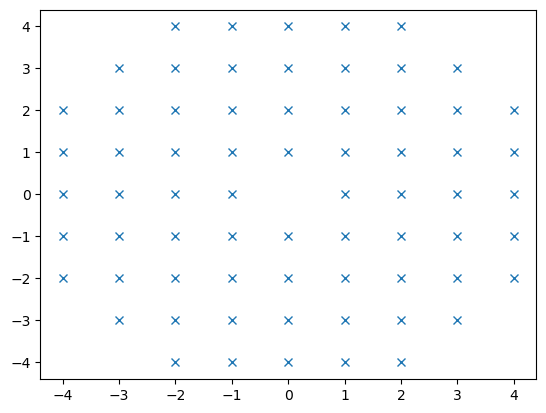

In [3]:
fig, ax = plt.subplots()
ax.plot(idxs[:, 0], idxs[:, 1], 'x')

In [4]:
v = io.VRTStack(sorted(Path().glob("*nc")), subdataset="unwrapped_phase")

2024-03-12T21:13:46 - dolphin.io._readers - INFO - Overwriting slc_stack.vrt


In [5]:
b = v[:, 3000:3512, 3000:3512]
bifg = np.array(np.exp(1j * np.nan_to_num(b))).astype("complex64")

## Numba version in dolphin

In [10]:
radius = 5
outsim_med_circ = similarity.median_similarity(bifg, search_radius=radius)

In [7]:
weights = np.ones(bifg[0].shape)

In [96]:
%%timeit
# similarity.median_similarity(bifg, radius, weights=weights).shape
similarity.median_similarity(bifg, radius).shape

619 ms ± 20.9 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


## Ke's c++ version

In [9]:
import psps.cppsimilarity

ps = np.ones(b.shape[1:], dtype=bool)

In [10]:
%%timeit

o_psps = psps.cppsimilarity.median_similarity(np.angle(bifg), ps, 68, 0, 5)

3.04 s ± 31 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [11]:
o_psps = psps.cppsimilarity.median_similarity(np.angle(bifg), ps, 68, 0, 5)

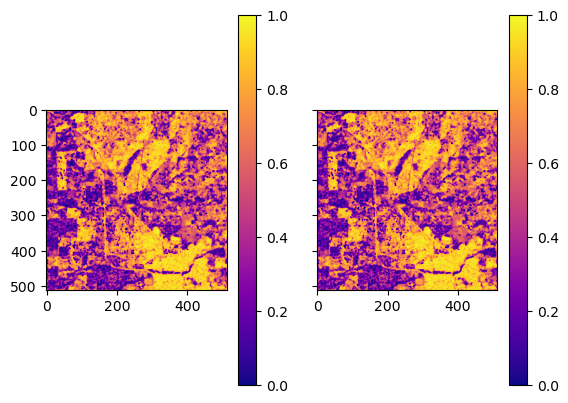

In [12]:
fig, axes = plt.subplots(ncols=2, sharex=True, sharey=True)

titles = ["numba median", "psps"]
for ax, img, t in zip(axes, [outsim_med_circ, o_psps], titles):
    axim = ax.imshow(img, cmap="plasma", vmax=1, vmin=0)
    fig.colorbar(axim, ax=ax)

In [13]:
%%time
bb = similarity.sim_moving(bifg, 9)
bb.shape

CPU times: user 4.99 s, sys: 438 ms, total: 5.43 s
Wall time: 4.71 s


(503, 503)

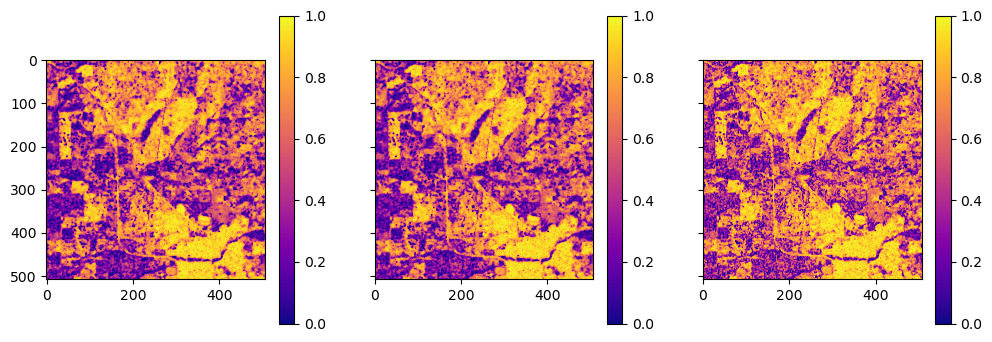

In [27]:
fig, axes = plt.subplots(ncols=3, sharex=True, sharey=True, figsize=(12, 4))

titles = ["numba median", "psps", 'jax']
for ax, img, t in zip(axes, [outsim_med_circ, o_psps, bb], titles):
    axim = ax.imshow(img, cmap="plasma", vmax=1, vmin=0)
    fig.colorbar(axim, ax=ax)

In [13]:
import h5py
import colorcet
from dolphin import timeseries

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


In [20]:
np.ma.masked_greater?

Signature: np.ma.masked_greater(x, value, copy=True)
Docstring:
Mask an array where greater than a given value.

This function is a shortcut to ``masked_where``, with
`condition` = (x > value).

See Also
--------
masked_where : Mask where a condition is met.

Examples
--------
>>> import numpy.ma as ma
>>> a = np.arange(4)
>>> a
array([0, 1, 2, 3])
>>> ma.masked_greater(a, 2)
masked_array(data=[0, 1, 2, --],
             mask=[False, False, False,  True],
       fill_value=999999)
File:      ~/miniconda3/envs/mapping-311/lib/python3.11/site-packages/numpy/ma/core.py
Type:      function

In [21]:
with h5py.File("20221107_20221119.unw.nc") as hf:
    cor1 = hf["interferometric_correlation"][()]
    tc = hf["temporal_coherence"][()]
    psmask = np.ma.masked_equal(hf['persistent_scatterer_mask'][()], 255)

In [24]:
tc_block = tc[3000:3512, 3000:3512]

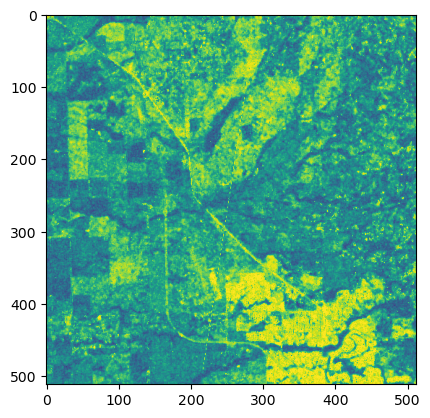

In [25]:
plt.figure()
plt.imshow(tc_block)

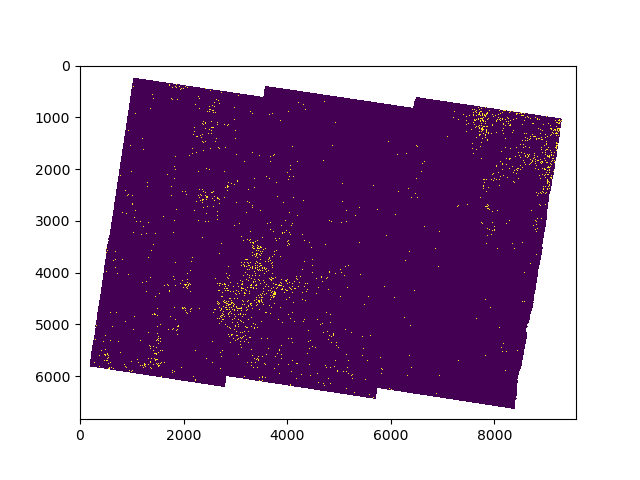

In [22]:
plt.figure()
plt.imshow(psmask, interpolation='none')

## Temp coh-weighted similarity

In [39]:
radius

5

In [30]:
outsim_tc = similarity.median_similarity(bifg, radius, weights=tc_block)

In [35]:
%matplotlib widget

In [97]:
w2 = tc_block.copy()
w2[tc_block < 0.5] = 0
w2[tc_block > .4] = 1
w2 = w2.astype(bool)

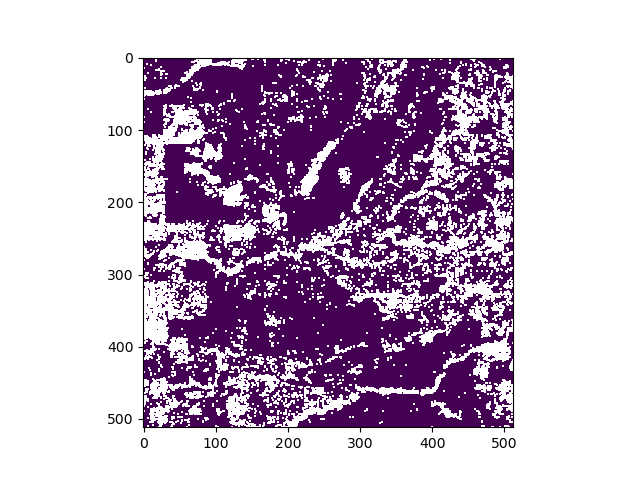

In [83]:
plt.figure()
plt.imshow(w2)

In [100]:
%%timeit
similarity.median_similarity(bifg, search_radius=9, weights=w2).shape


929 ms ± 6.43 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


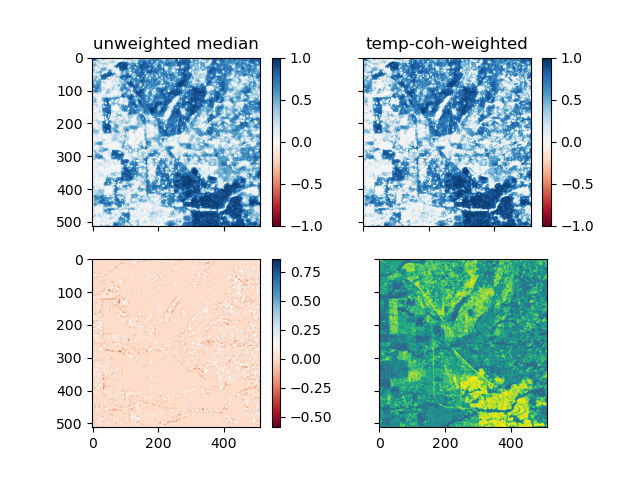

In [98]:
o1 = similarity.median_similarity(bifg, search_radius=9)
# o2 = similarity.median_similarity(bifg, search_radius=9, weights=tc_block)
o2 = similarity.median_similarity(bifg, search_radius=9, weights=w2)

fig, axes = plt.subplots(ncols=2, nrows=2, sharex=True, sharey=True)
axes=axes.ravel()
titles = ["unweighted median", "temp-coh-weighted"]
# for ax, img, t in zip(axes, [outsim_med_circ, outsim_tc], titles):
for ax, img, t in zip(axes, [o1, o2], titles):
    axim = ax.imshow(img, cmap="RdBu", vmax=1, vmin=-1)
    fig.colorbar(axim, ax=ax)
    ax.set_title(t)

axim = axes[2].imshow(o1 - o2, cmap="RdBu")
fig.colorbar(axim, ax=axes[2])

axes[-1].imshow(tc_block)

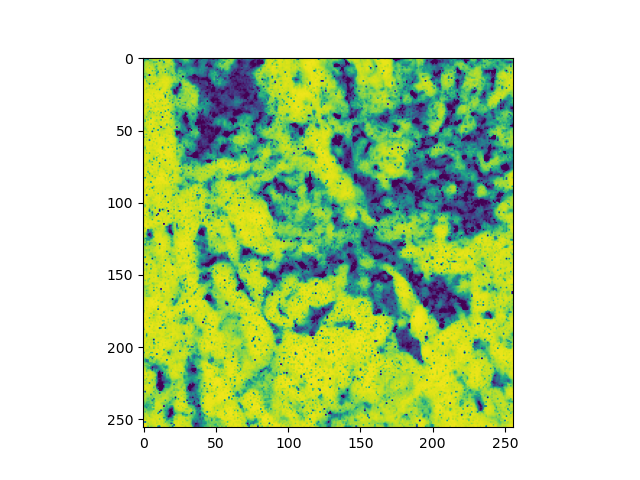

In [59]:
plt.figure();
plt.imshow(proc([v], slice(4000, 4256), slice(4000, 4256))[0], vmin=0, vmax=1)

In [5]:
sorted(Path().glob("*phase.vrt"))

[PosixPath('20221107_20221119.unw.nc_phase.vrt'),
 PosixPath('20221107_20221201.unw.nc_phase.vrt'),
 PosixPath('20221107_20221213.unw.nc_phase.vrt'),
 PosixPath('20221107_20230106.unw.nc_phase.vrt'),
 PosixPath('20221107_20230118.unw.nc_phase.vrt'),
 PosixPath('20221107_20230130.unw.nc_phase.vrt'),
 PosixPath('20221107_20230211.unw.nc_phase.vrt'),
 PosixPath('20221107_20230223.unw.nc_phase.vrt'),
 PosixPath('20221107_20230307.unw.nc_phase.vrt'),
 PosixPath('20221107_20230319.unw.nc_phase.vrt'),
 PosixPath('20221107_20230331.unw.nc_phase.vrt'),
 PosixPath('20221107_20230412.unw.nc_phase.vrt'),
 PosixPath('20221107_20230424.unw.nc_phase.vrt'),
 PosixPath('20221107_20230506.unw.nc_phase.vrt'),
 PosixPath('20221107_20230518.unw.nc_phase.vrt'),
 PosixPath('20221107_20230530.unw.nc_phase.vrt'),
 PosixPath('20221107_20230611.unw.nc_phase.vrt'),
 PosixPath('20221107_20230705.unw.nc_phase.vrt'),
 PosixPath('20221107_20230717.unw.nc_phase.vrt'),
 PosixPath('20221107_20230729.unw.nc_phase.vrt')]

In [2]:
import numba
numba.config

In [9]:
sorted(Path().glob("*phase.tif"))

[PosixPath('20221107_20221119.unw.nc.phase.tif'),
 PosixPath('20221107_20221201.unw.nc.phase.tif'),
 PosixPath('20221107_20221213.unw.nc.phase.tif'),
 PosixPath('20221107_20230106.unw.nc.phase.tif'),
 PosixPath('20221107_20230118.unw.nc.phase.tif'),
 PosixPath('20221107_20230130.unw.nc.phase.tif'),
 PosixPath('20221107_20230211.unw.nc.phase.tif'),
 PosixPath('20221107_20230223.unw.nc.phase.tif'),
 PosixPath('20221107_20230307.unw.nc.phase.tif'),
 PosixPath('20221107_20230319.unw.nc.phase.tif'),
 PosixPath('20221107_20230331.unw.nc.phase.tif'),
 PosixPath('20221107_20230412.unw.nc.phase.tif'),
 PosixPath('20221107_20230424.unw.nc.phase.tif'),
 PosixPath('20221107_20230506.unw.nc.phase.tif'),
 PosixPath('20221107_20230518.unw.nc.phase.tif'),
 PosixPath('20221107_20230530.unw.nc.phase.tif'),
 PosixPath('20221107_20230611.unw.nc.phase.tif'),
 PosixPath('20221107_20230705.unw.nc.phase.tif'),
 PosixPath('20221107_20230717.unw.nc.phase.tif'),
 PosixPath('20221107_20230729.unw.nc.phase.tif')]

In [2]:
similarity.create_similarities(sorted(Path().glob("*phase.tif")), 'simmedian7.tif', block_shape=(512, 512), num_threads=4)

2024-03-07T13:24:03 - dolphin.io._readers - INFO - Overwriting sim_inputs.vrt


  0%|          | 0/266 [00:00<?, ?it/s]

2024-03-07T13:26:23 - dolphin.similarity - INFO - Creating overviews for unwrapped images


In [10]:
similarity.create_similarities(sorted(Path().glob("*phase.tif")), 'simmax8.tif', sim_type="max", block_shape=(512, 512), num_threads=4)

2024-03-07T15:11:53 - dolphin.io._readers - INFO - Overwriting sim_inputs.vrt


  0%|          | 0/266 [00:00<?, ?it/s]

rows = slice(0, 512, None), cols = slice(1536, 2048, None), block.shape = (18, 512, 512), out_avg.shape = (512, 512)
rows = slice(0, 512, None), cols = slice(1024, 1536, None), block.shape = (18, 512, 512), out_avg.shape = (512, 512)
rows = slice(0, 512, None), cols = slice(2048, 2560, None), block.shape = (18, 512, 512), out_avg.shape = (512, 512)
rows = slice(0, 512, None), cols = slice(512, 1024, None), block.shape = (18, 512, 512), out_avg.shape = (512, 512)
rows = slice(0, 512, None), cols = slice(2560, 3072, None), block.shape = (18, 512, 512), out_avg.shape = (512, 512)
rows = slice(0, 512, None), cols = slice(3072, 3584, None), block.shape = (18, 512, 512), out_avg.shape = (512, 512)
rows = slice(0, 512, None), cols = slice(3584, 4096, None), block.shape = (18, 512, 512), out_avg.shape = (512, 512)
rows = slice(0, 512, None), cols = slice(4096, 4608, None), block.shape = (18, 512, 512), out_avg.shape = (512, 512)
rows = slice(512, 1024, None), cols = slice(512, 1024, None), blo

2024-03-07T15:14:20 - dolphin.similarity - INFO - Creating overviews for unwrapped images


rows = slice(6144, 6656, None), cols = slice(8192, 8704, None), block.shape = (18, 512, 512), out_avg.shape = (512, 512)


In [6]:
%matplotlib widget

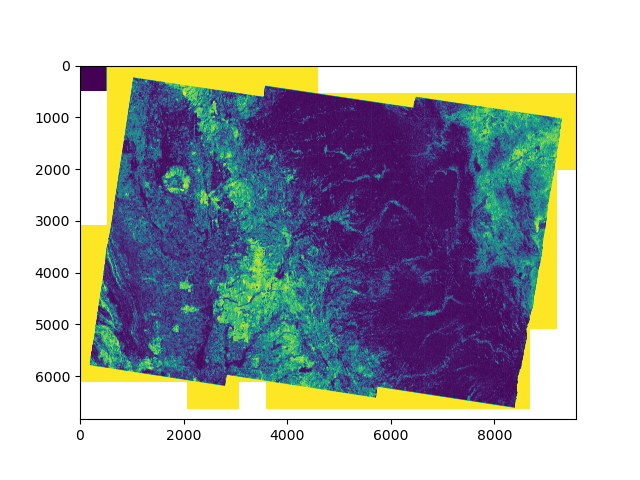

In [25]:
fig, ax = plt.subplots()
ax.imshow(io.load_gdal('simmedian7.tif'),vmin=0, vmax=1)

In [6]:
%matplotlib widget

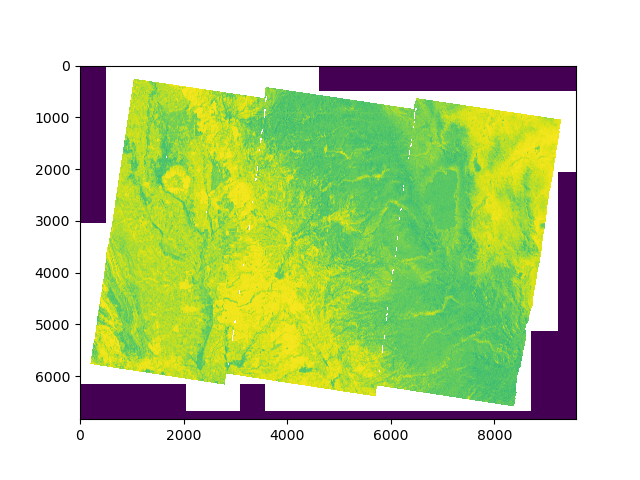

In [11]:
fig, ax = plt.subplots()
ax.imshow(io.load_gdal('simmax8.tif'), vmin=0, vmax=1)

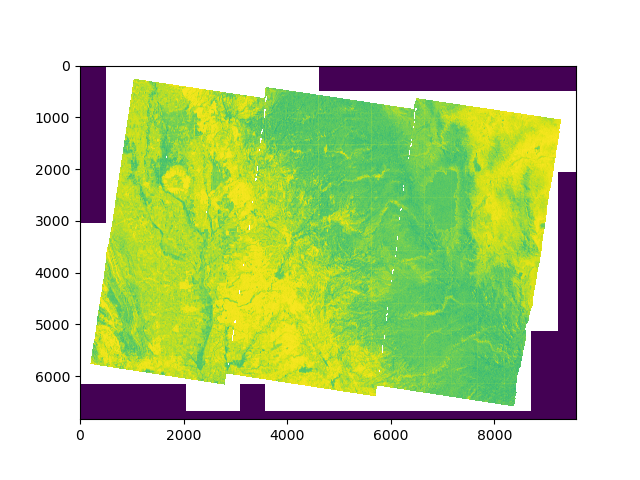

In [9]:
fig, ax = plt.subplots()
ax.imshow(io.load_gdal('simmax8.tif'), vmin=0, vmax=1)

In [ ]:
fig, ax = plt.subplots()
ax.imshow(io.load_gdal('simmax7.tif'), vmin=0, vmax=1)

In [ ]:
fig, axes = plt.subplots(ncols=3, sharex=True, sharey=True)


ax = axes[0]
axim = ax.imshow(sim_circ[::2, ::2], cmap=colorcet.cm.fire, vmin=0, vmax=1)
fig.colorbar(axim, ax=ax)
ax.set_title("Median Phase Similarity")

ax = axes[1]
axim = ax.imshow(tc[::2, ::2], cmap=colorcet.cm.fire, vmin=0, vmax=1)
fig.colorbar(axim, ax=ax)
ax.set_title("Temporal coherence")

ax = axes[2]
axim = ax.imshow(cor1[::2, ::2], cmap=colorcet.cm.fire, vmin=0, vmax=1)
fig.colorbar(axim, ax=ax)
ax.set_title("ifg 1 correlation")

(20, 512, 512)

In [11]:
outsim_med_circ.shape

(512, 512)

In [12]:
weights = outsim_med_circ

In [14]:
from dolphin import interpolation, interferogram

In [17]:
import sweets.plotting

In [24]:
%matplotlib widget
%matplotlib inline

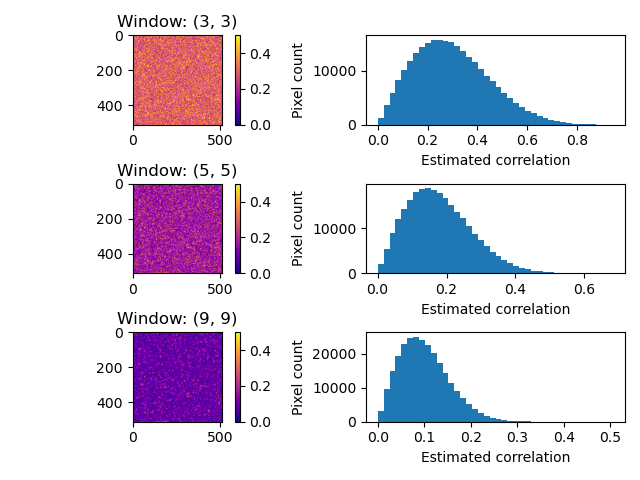

In [32]:
fig, axes = plt.subplots(nrows=3, ncols=2)
noise = np.random.randn(512, 512) + 1j * np.random.randn(512, 512)

for i, w in enumerate([3, 5, 9]):
    ax = axes[i, 0]
    cor = interferogram.estimate_correlation_from_phase(noise, (w, w))
    axim = ax.imshow(cor, vmin=0, vmax=.5, cmap='plasma')
    fig.colorbar(axim, ax=ax)
    ax.set_title(f"Window: ({w}, {w})")

    ax = axes[i, 1]
    ax.hist(cor.ravel(), bins=40)
    ax.set_xlabel("Estimated correlation")
    ax.set_ylabel("Pixel count")

fig.tight_layout()

In [35]:
cor2 = interferogram.estimate_correlation_from_phase(bifg[2], 7)

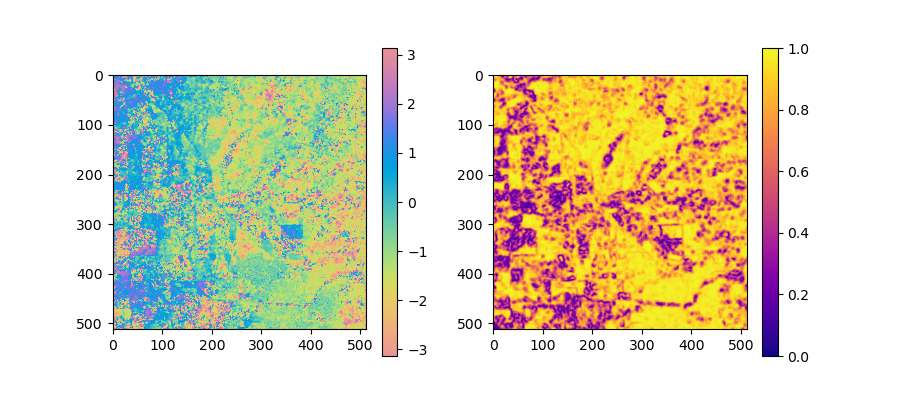

In [40]:
fig, axes = plt.subplots(ncols=2, figsize=(9, 4))
sweets.plotting.plot_ifg(bifg[2], ax=axes[0])
ax=axes[1]
axim = ax.imshow(cor2, vmin=0, vmax=1, cmap='plasma')
fig.colorbar(axim, ax=ax)


In [43]:
%%time
weights = cor2.copy()


ifg_interp = interpolation.interpolate(bifg[2], weights=weights, weight_cutoff=0.7)

CPU times: user 101 ms, sys: 1.18 ms, total: 102 ms
Wall time: 30.9 ms


(<Figure size 900x800 with 8 Axes>, <Axes: >)

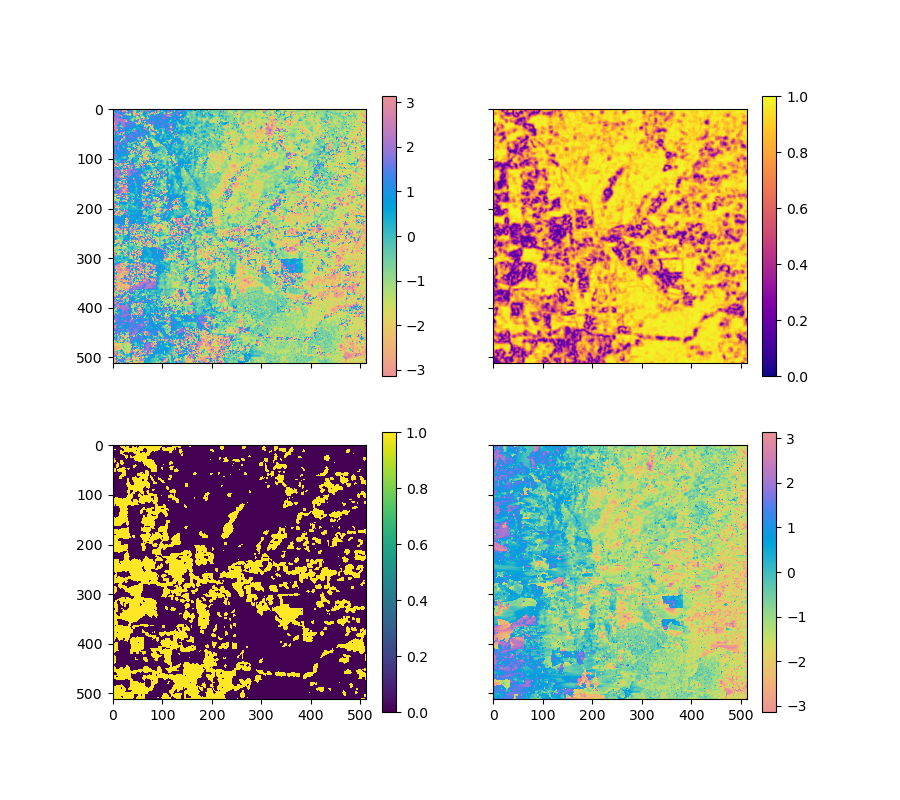

In [48]:
fig, axes = plt.subplots(ncols=2, nrows=2, figsize=(9, 8), sharex=True, sharey=True)
axes = axes.ravel()
sweets.plotting.plot_ifg(bifg[2], ax=axes[0])

ax=axes[1]
axim = ax.imshow(cor2, vmin=0, vmax=1, cmap='plasma')
fig.colorbar(axim, ax=ax)

mask = weights < 0.7
ax=axes[2]
axim = ax.imshow(mask, vmin=0, vmax=1, interpolation='none')
fig.colorbar(axim, ax=ax)

sweets.plotting.plot_ifg(ifg_interp, ax=axes[-1])

In [52]:
weights = cor2[:] >= 0.7

In [53]:
    weights_float = np.clip(weights.astype(np.float32), 0, 1)
    # Ensure weights are between 0 and 1
    if np.any(weights_float > 1):
        logger.warning("weights array has values greater than 1. Clipping to 1.")
    if np.any(weights_float < 0):
        logger.warning("weights array has negative values. Clipping to 0.")
    weights_float = np.clip(weights_float, 0, 1)


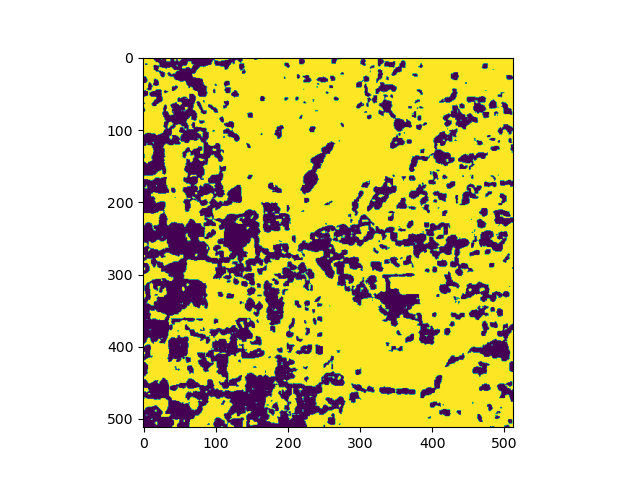

In [55]:
plt.figure()
plt.imshow(weights_float)

(<Figure size 900x800 with 8 Axes>, <Axes: >)

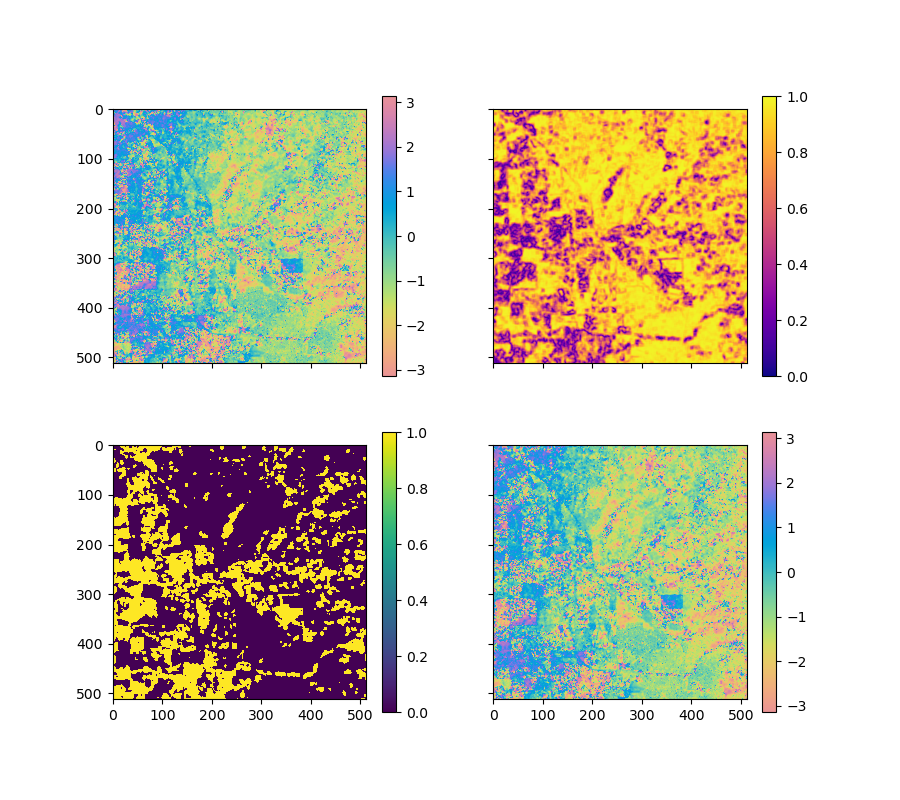

In [50]:
fig, axes = plt.subplots(ncols=2, nrows=2, figsize=(9, 8), sharex=True, sharey=True)
axes = axes.ravel()
sweets.plotting.plot_ifg(bifg[2], ax=axes[0])

ax=axes[1]
axim = ax.imshow(cor2, vmin=0, vmax=1, cmap='plasma')
fig.colorbar(axim, ax=ax)

mask = weights < 0.7
ax=axes[2]
axim = ax.imshow(mask, vmin=0, vmax=1, interpolation='none')
fig.colorbar(axim, ax=ax)

sweets.plotting.plot_ifg(interpolation.interpolate(bifg[2], weights=cor2[:] >= 0.7), ax=axes[-1])

In [51]:
sweets.plotting.plot_ifg(bifg[2].conj() * interpolation.interpolate(bifg[2], weights=cor2[:] >= 0.7), ax=axes[-1])

(<Figure size 1800x1600 with 9 Axes>, <Axes: >)